**Лекция 1**

# Анализ данных, суррогатное моделирование и оптимизация в прикладных задачах

**Весенний семестр**

к.т.н. Андрей Александрович Савельев \
savelyev.aa@mipt.ru

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Введение" data-toc-modified-id="Введение-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Введение</a></span><ul class="toc-item"><li><span><a href="#Содержание-курса" data-toc-modified-id="Содержание-курса-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Содержание курса</a></span></li><li><span><a href="#Материалы" data-toc-modified-id="Материалы-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Материалы</a></span></li><li><span><a href="#Планирование-экспериментов-(DOE)" data-toc-modified-id="Планирование-экспериментов-(DOE)-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Планирование экспериментов (DOE)</a></span></li></ul></li><li><span><a href="#Числовые-характеристики-выборки-данных" data-toc-modified-id="Числовые-характеристики-выборки-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Числовые характеристики выборки данных</a></span><ul class="toc-item"><li><span><a href="#Показатели-положения-центра-распределения" data-toc-modified-id="Показатели-положения-центра-распределения-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Показатели положения центра распределения</a></span></li><li><span><a href="#Разброс-распределения-данных" data-toc-modified-id="Разброс-распределения-данных-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Разброс распределения данных</a></span></li><li><span><a href="#Взаимосвязи-между-переменными" data-toc-modified-id="Взаимосвязи-между-переменными-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Взаимосвязи между переменными</a></span></li><li><span><a href="#Взаимосвязи-между-переменными" data-toc-modified-id="Взаимосвязи-между-переменными-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Взаимосвязи между переменными</a></span></li></ul></li><li><span><a href="#Визуализация" data-toc-modified-id="Визуализация-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Визуализация</a></span><ul class="toc-item"><li><span><a href="#Квартет-Энскомба" data-toc-modified-id="Квартет-Энскомба-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Квартет Энскомба</a></span></li><li><span><a href="#Диаграммы-Каиро" data-toc-modified-id="Диаграммы-Каиро-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Диаграммы Каиро</a></span></li></ul></li><li><span><a href="#Источники" data-toc-modified-id="Источники-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Источники</a></span></li></ul></div>

In [19]:
# Imports
import sys
sys.path.append('../scripts')
import graph_utils

import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

In [20]:
# Styles
import matplotlib
matplotlib.rcParams['font.size'] = 16
matplotlib.rcParams['lines.linewidth'] = 1.5
matplotlib.rcParams['lines.markersize'] = 7
cm = plt.cm.tab10  # Colormap

import seaborn
seaborn.set_style('whitegrid')

from IPython.display import Image
im_width = 1000

In [21]:
# import warnings
# warnings.filterwarnings('ignore')

# %config Completer.use_jedi = False

In [22]:
%%html
<style>
    .container.slides .celltoolbar, .container.slides .hide-in-slideshow {display: None ! important;}
</style>

---

## Введение

### Содержание курса

**Весенний семестр**

1. Данные и методы работы с ними. Числовые характеристики выборки: среднее, среднеквадратичное отклонение, коэффициент корреляции
1. Основы теории вероятности. Вероятностная модель, условная вероятность, формула Байеса
1. Случайные величины и их распределения, числовые характеристики случайных величин
1. Случайный вектор. Многомерное нормальное распределение, ковариационная матрица
1. Условное математическое ожидание, условная дисперсия. Маргинальные и условные распределения
1. Случайные процессы, гауссовские процессы
1. Регрессия на основе гауссовских процессов 
1. Оптимизация регрессионной кривой, влияние параметров ядра и амплитуды шума на регрессионную кривую
1. Алгоритм эффективной глобальной оптимизации

### Материалы

**Основная литература**

1. *Ширяев А.Н.* Вероятность &mdash; 1. &mdash; М.: МЦНМО, 2007. &mdash; 517 с.
1. *Rasmussen C.E. & Williams C.K.I.* [Gaussian Processes for Machine Learning](http://www.gaussianprocess.org/gpml/). The MIT Press, 2006. 248 p.


**Дополнительная литература**

1. *Шпигельхалтер Д.* Искусство статистики. Как находить ответы в данных. &mdash; М.: МИФ, 2021. &mdash; 448 с.
1. *Гасников А.В. и др.* Лекции по случайным процессам. &mdash; 2019. &mdash; 252 с.
1. Материалы по гауссовским процессам авторов [P. Roelants](https://peterroelants.github.io/) и [M. Krasser ](http://krasserm.github.io/)


**Видеокурсы**

1. [Байесовские методы в машинном обучении](https://www.youtube.com/watch?v=Ejsr3S79gcQ&ab_channel=%D0%A4%D0%9A%D0%9D%D0%92%D0%A8%D0%AD), к.ф.-м.н. Дмитрий Петрович Ветров, ФКН ВШЭ, [https://bayesgroup.ru/about/)
1. [Машинное обучение](https://www.youtube.com/watch?v=SZkrxWhI5qM&list=PLJOzdkh8T5krxc4HsHbB8g8f0hu7973fK&index=1), д.ф.-м.н. Константин Вячеславович Воронцов, ШАД (Яндекс)

### Планирование экспериментов (DOE)

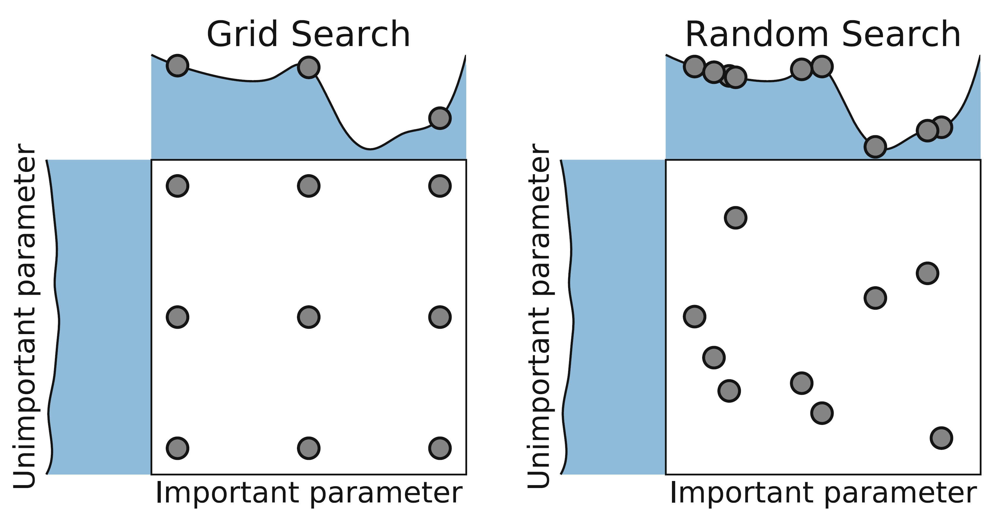

In [23]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/Grid_vs_Random.png', width=0.75*im_width))

---

## Числовые характеристики выборки данных

### Показатели положения центра распределения

Три толкования термина &laquo;среднее значение&raquo;:

1. Мода: чаще всего встречающееся значение в выборке
1. Среднее арифметическое (выборочное среднее): сумма всех величин, делённая на их количество
1. Медиана: значение среднего в ранжированном ряду

### Разброс распределения данных

1. Размах. Размах чувствителен к экстремальным значениям
1. Стандартное (среднеквадратичное) отклонение
1. Интерквартильный размах &mdash; разница между третьим и первым квартилями

> N-й процентиль &mdash; значение, которое не превышает N % наблюдений. \
> 25-й процентиль называют первым квартилем, а 50-й &mdash; медианой

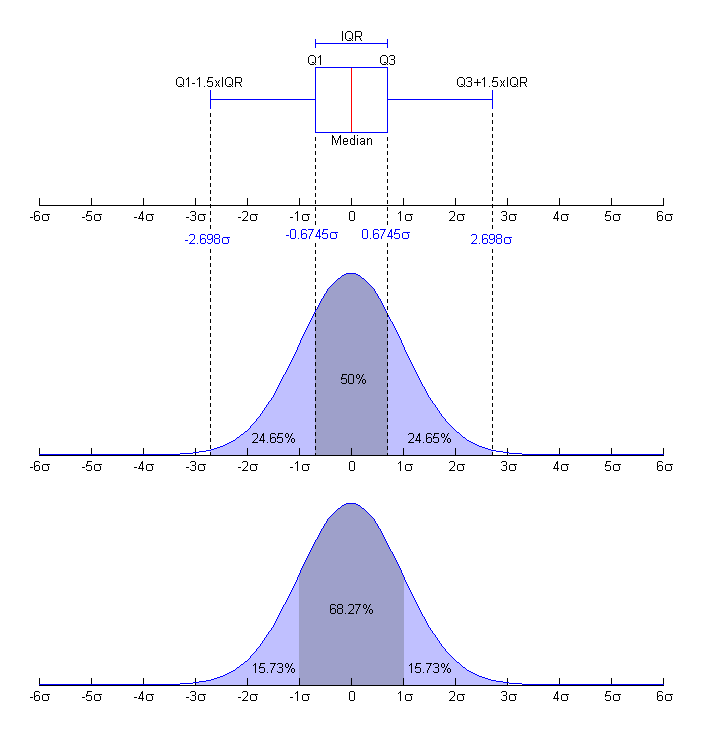

In [24]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/Boxplot_vs_PDF.png', width=0.75*im_width))

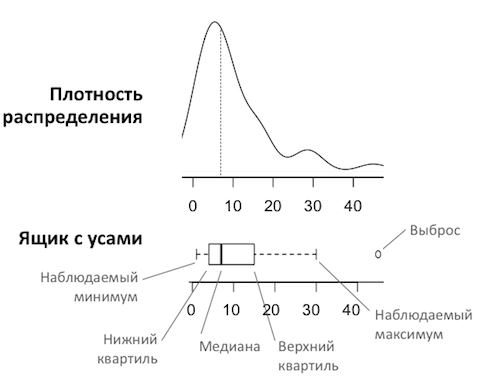

In [25]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/Boxplot_vs_Density.png', width=0.5*im_width))

### Взаимосвязи между переменными

Прямую или обратную зависимость между величинами удобно выражать одним числом.
Чаще всего для этого используется **коэффициент корреляции Пирсона**.
Коэффициент корреляции Пирсона принимает значения от -1 до 1 и показывает, насколько близко *к прямой* расположены точки на диаграмме.

y=x^1: rP = 1.000000
y=x^3: rP = 0.915525
y=x^5: rP = 0.819412
y=x^7: rP = 0.744118
y=x^9: rP = 0.685194


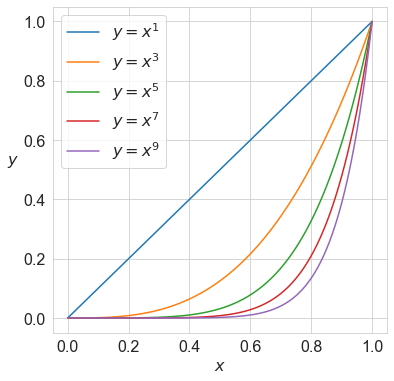

In [41]:
graph_utils.hide_code_in_slideshow()
x = np.linspace(0, 1, 101)
plt.figure(figsize=(6, 6))

for n in range(1,10,2):
    y = x**n
    plt.plot(x, y, label=f'$y=x^{n}$')
    rP = stats.pearsonr(x, y)[0]
    print(f'y=x^{n}: rP = {rP:.6f}')

plt.xlabel('$x$')
plt.ylabel('$y$', rotation=0, ha='right')
plt.legend() 
plt.show()

### Взаимосвязи между переменными

Ранговый коэффициент **корреляции Спирмена** зависит не от конкретных численных значений, а от их рангов, то есть занимаемых ими мест, если их упорядочить по величине.
Он может быть близок к 1 или -1, если точки близки к линии со стабильным подъёмом или понижением, даже если эта линия не является прямой. 

y=x^1: rP = 1.000000, rS = 1.000000
y=x^3: rP = 0.915525, rS = 1.000000
y=x^5: rP = 0.819412, rS = 1.000000
y=x^7: rP = 0.744118, rS = 1.000000
y=x^9: rP = 0.685194, rS = 1.000000


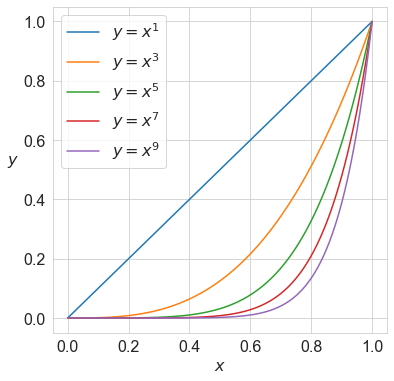

In [42]:
graph_utils.hide_code_in_slideshow()
x = np.linspace(0, 1, 101)
plt.figure(figsize=(6, 6))

for n in range(1,10,2):
    y = x**n
    plt.plot(x, y, label=f'$y=x^{n}$')
    rP = stats.pearsonr(x, y)[0]
    rS = stats.spearmanr(x, y)[0]
    print(f'y=x^{n}: rP = {rP:.6f}, rS = {rS:.6f}')

plt.xlabel('$x$')
plt.ylabel('$y$', rotation=0, ha='right')
plt.legend() 
plt.show()

---

## Визуализация

### Квартет Энскомба

Четыре набора числовых данных, у которых простые статистические свойства идентичны, но их графики существенно отличаются.
Каждый набор состоит из 11 пар чисел.
Квартет был составлен в 1973 году английским математиком Ф. Дж. Энскомбом для иллюстрации важности применения графиков для статистического анализа и влияния выбросов значений на свойства всего набора данных.

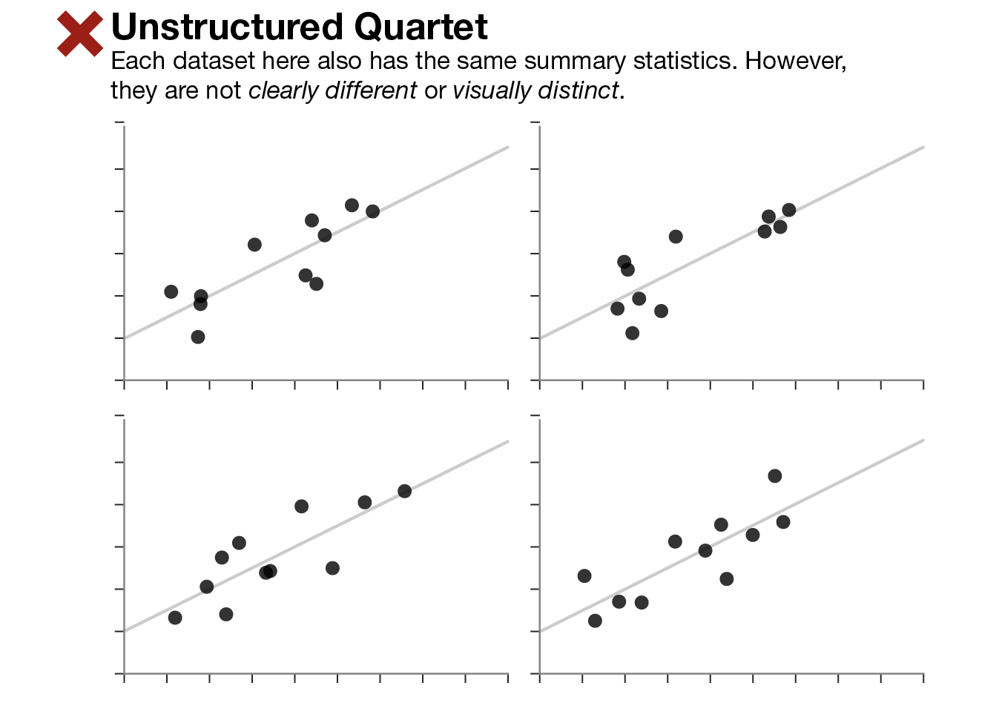

In [28]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/Unstructured.png', width=im_width))

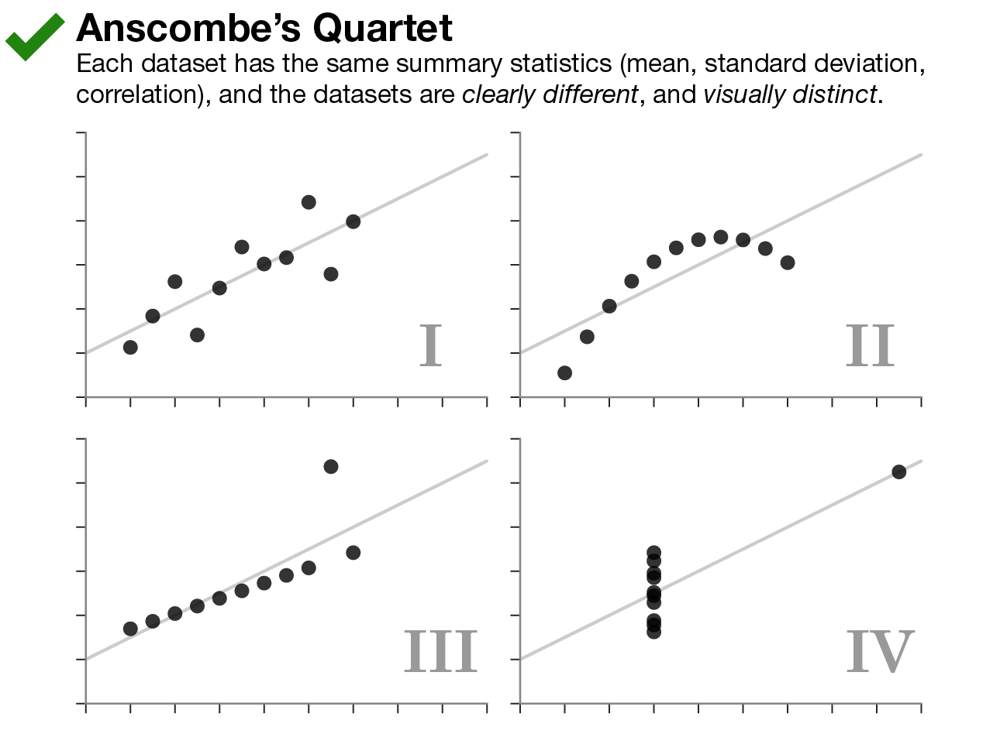

In [29]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/Anscombe.png', width=im_width))

### Диаграммы Каиро

[Альберто Каиро](http://albertocairo.com/)

In [30]:
N = 2
data = []
for i in range(1,N+1):
    data.append(np.genfromtxt(f'../pix/01.Intro/dataset-{i}.csv',delimiter=',',unpack=True))

print(np.shape(data[0]))
print(data[0][:,:10])

(2, 142)
[[73.32235805 72.36182115 67.71701478 31.67688913 67.88855634 45.33066155
  25.61206052 62.52129381 46.05016563 60.00655725]
 [87.41832305 92.96291103 90.48854177 98.27494484 80.44119672 42.57950384
  64.90701755 45.41331208 87.40709717 71.28652314]]


In [31]:
print(f'X_m = {data[0][0].mean():.6}, {data[1][0].mean():.6}')
print(f'Y_m = {data[0][1].mean():.6}, {data[1][1].mean():.6}\n')

print(f'X_std = {data[0][0].std():.6}, {data[1][0].std():.6}')
print(f'Y_std = {data[0][1].std():.6}, {data[1][1].std():.6}\n')

Pr = [stats.pearsonr(item[0], item[1])[0] for item in data]
Sr = [stats.spearmanr(item[0], item[1])[0] for item in data]
print(f'Pearson corr.  = {Pr[0]:.6}, {Pr[1]:.6}')
# print(f'Spearman corr. = {Sr[0]:.6}, {Sr[1]:.6}')

X_m = 54.2639, 54.2633
Y_m = 47.8325, 47.8323

X_std = 16.7068, 16.706
Y_std = 26.8405, 26.8404

Pearson corr.  = -0.0641771, -0.0644719


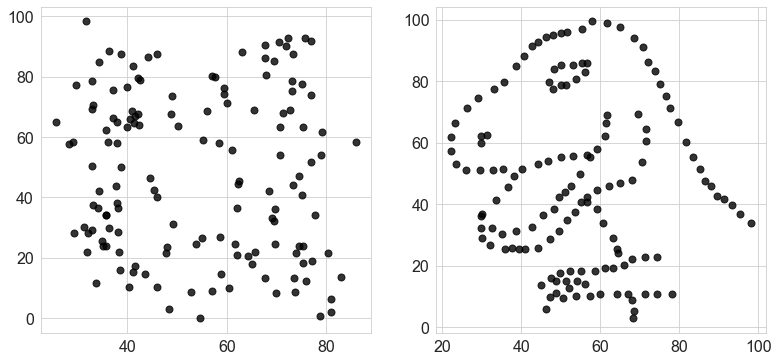

In [32]:
# Show data
fig, axes = plt.subplots(1, N, figsize=(13,6))

for i, ax in enumerate(axes):
    ax.plot(data[i][0], data[i][1], 'ko', alpha=0.8)
plt.show()

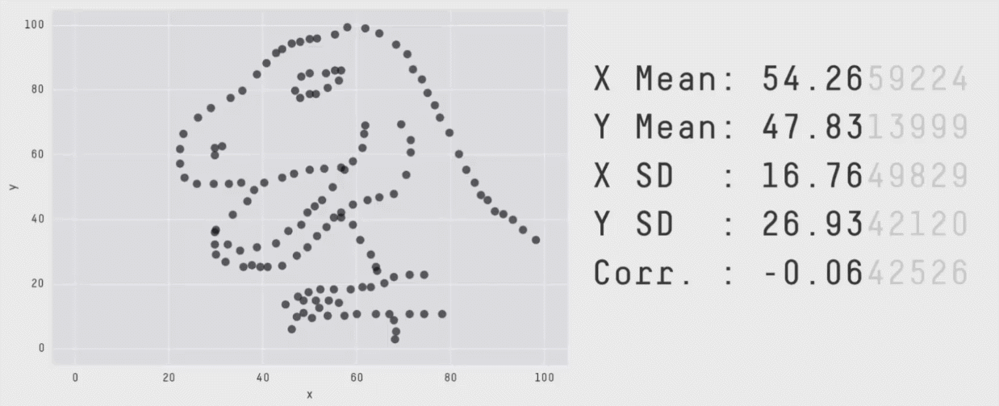

In [39]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/DinoSequential.gif', width=im_width))
# display(Image('../pix/01.Intro/AllDinosAnimated.gif', width=im_width))

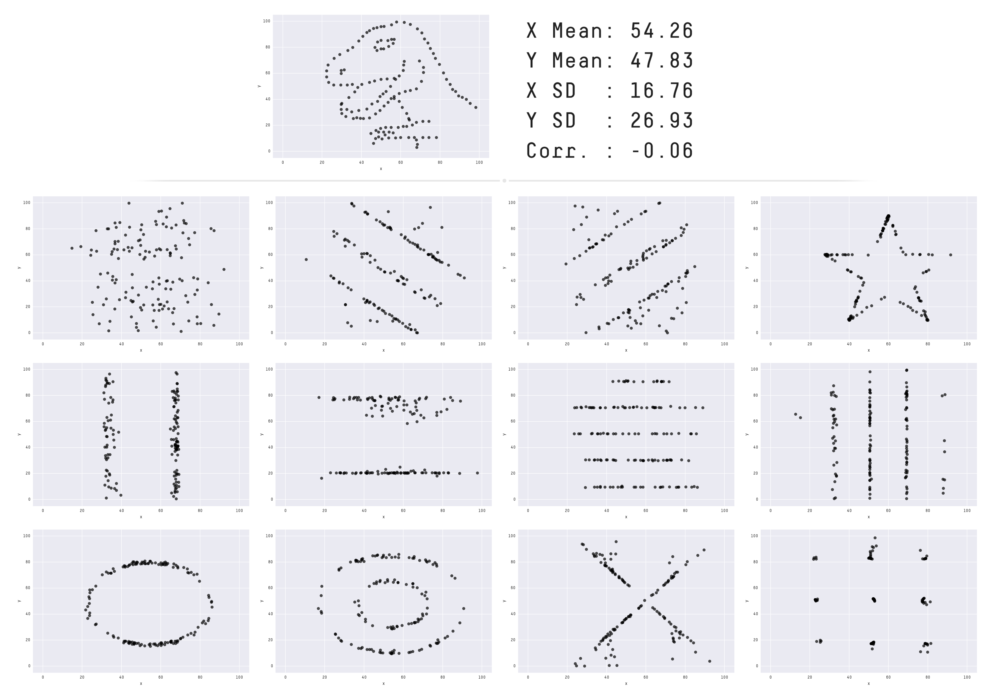

In [40]:
graph_utils.hide_code_in_slideshow()
display(Image('../pix/01.Intro/AllDinos.png', width=im_width))

---

## Источники

1. Шпигельхалтер Д. Искусство статистики. Как находить ответы в данных. &mdash; М.: Манн, Иванов и Фербер, 2021. &mdash; 448 с.